In [1]:
%pylab inline
import sys

sys.path.insert(0, '..')

import torch
from torch.autograd import Variable
from torch import FloatTensor
from skimage import data
import matplotlib.pyplot as plt


from data_generation.pipeline import ImageDegradationPipeline


def numpy2tensor(arr):
    if len(arr.shape) < 3:
        arr = np.expand_dims(arr, -1)
    return FloatTensor(arr).permute(2, 0, 1).unsqueeze(0).float() / 255.0

def tensor2numpy(t, idx=None):
    t = torch.clamp(t, 0, 1)
    if idx is None:
        t = t[0, ...]
    else:
        t = t[idx, ...]
    return (t.permute(1, 2, 0).cpu().squeeze().numpy() * 255.0).astype('uint8')


cat = data.chelsea()
cat_tensor = numpy2tensor(cat).expand(3, -1, -1, -1)

camera = data.camera()
camera_tensor = numpy2tensor(camera).expand(3, -1, -1, -1)

Populating the interactive namespace from numpy and matplotlib


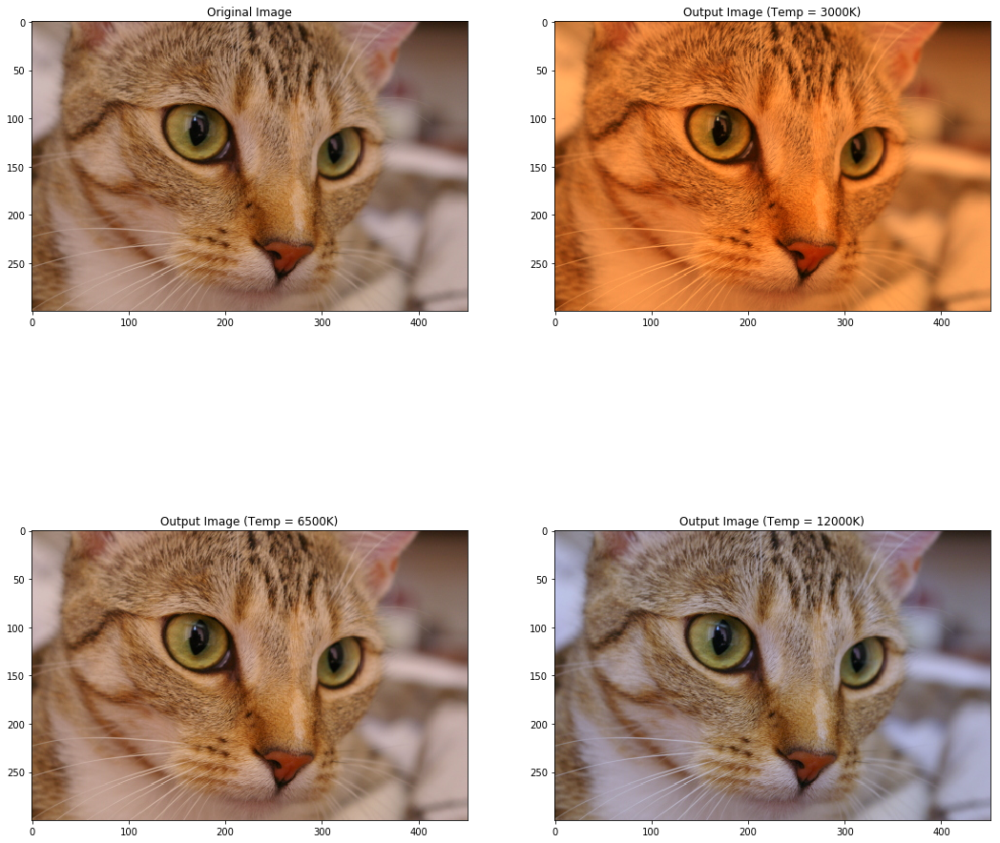

In [2]:
# Test White Balance

new_temp = [3000, 6500, 12000]

configs = [('UndosRGBGamma', {}),
           ('WhiteBalanceTemperature', {'new_temp': FloatTensor(new_temp),
                                        'new_tint': FloatTensor([0,0,0]),
                                        'mosaick_pattern': None}),
           ('sRGBGamma', {})
          ]

pipeline = ImageDegradationPipeline(configs)

cat_wb = pipeline(cat_tensor)
# Run again on GPU
pipeline = pipeline.cuda()
cat_wb = pipeline(cat_tensor.cuda()).cpu()

plt.figure(figsize=(18, 18))
plt.subplot(221)
plt.imshow(cat)
plt.title('Original Image')

for i, t in enumerate(new_temp):
    cat_wb_numpy = tensor2numpy(cat_wb, i)
    plt.subplot(222 + i)
    plt.imshow(cat_wb_numpy)
    plt.title('Output Image (Temp = {}K)'.format(t))
plt.show()

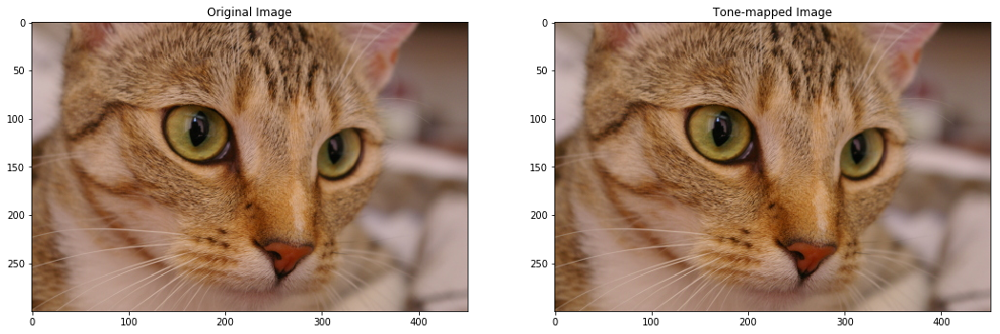

In [3]:
# Test ToneCurve.

configs = [('ToneCurveThreeZones', {"highlight": 0.5,
                                    "midtone": 0.0,
                                    "shadow": 0.2,
                                   }),
          ]

pipeline = ImageDegradationPipeline(configs)

cat_blurred = pipeline(cat_tensor)

cat_blurred_numpy = tensor2numpy(cat_blurred)

plt.figure(figsize=(18, 18))

plt.subplot(121)
plt.imshow(cat)
plt.title('Original Image')

plt.subplot(122)
plt.imshow(cat_blurred_numpy)
plt.title('Tone-mapped Image')


plt.show()

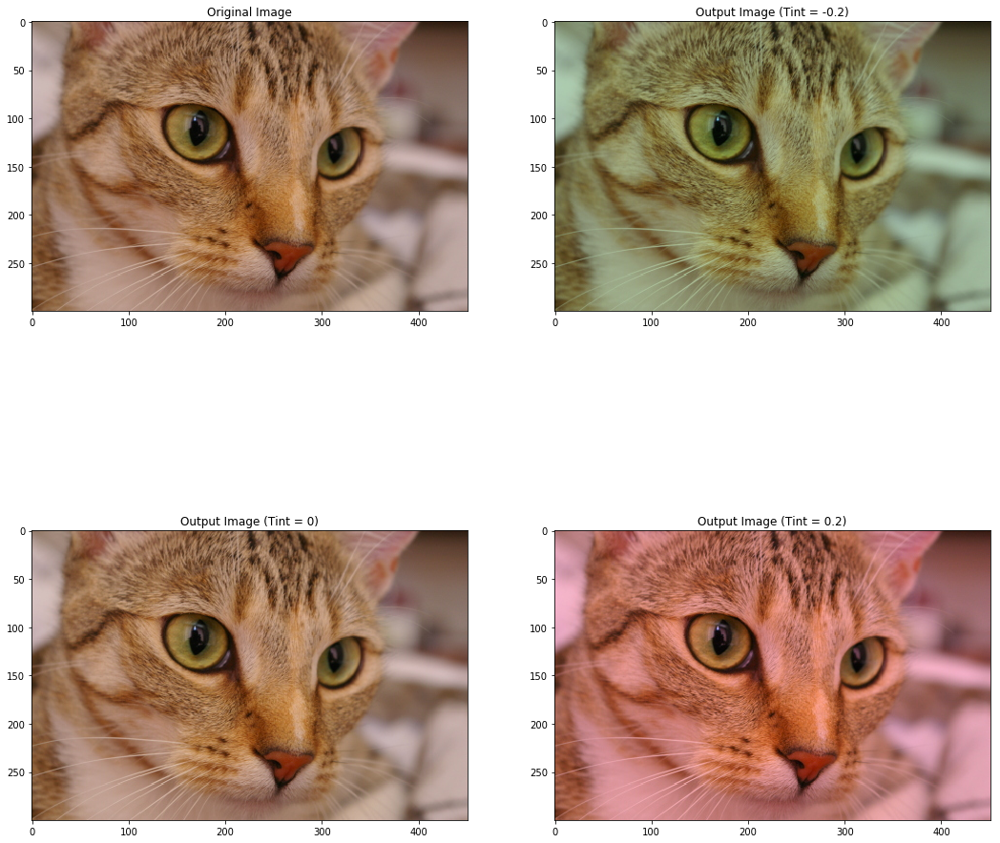

In [4]:
# Test tint

new_tint = [-0.2, 0, 0.2]

configs = [('UndosRGBGamma', {}),
           ('WhiteBalanceTemperature', {'new_temp': 6504,
                                        'new_tint': FloatTensor(new_tint),
                                        'mosaick_pattern': None}),
           ('sRGBGamma', {})
          ]

pipeline = ImageDegradationPipeline(configs)

cat_wb = pipeline(cat_tensor)
# Run again on GPU
pipeline = pipeline.cuda()
cat_wb = pipeline(cat_tensor.cuda()).cpu()

plt.figure(figsize=(18, 18))
plt.subplot(221)
plt.imshow(cat)
plt.title('Original Image')

for i, t in enumerate(new_tint):
    cat_wb_numpy = tensor2numpy(cat_wb, i)
    plt.subplot(222 + i)
    plt.imshow(cat_wb_numpy)
    plt.title('Output Image (Tint = {})'.format(t))
plt.show()

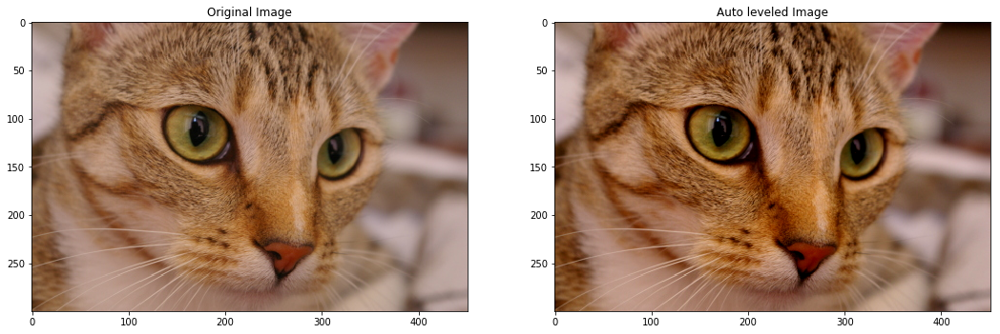

In [5]:
# Test Saturation

configs = [('AutoLevelNonDifferentiable', {'blkpt': 1,
                                           'whtpt': 99})]

pipeline = ImageDegradationPipeline(configs)

cat_blurred = pipeline(cat_tensor*0.8)

cat_blurred_numpy = tensor2numpy(cat_blurred)

plt.figure(figsize=(18, 18))

plt.subplot(121)
plt.imshow(cat)
plt.title('Original Image')

plt.subplot(122)
plt.imshow(cat_blurred_numpy)
plt.title('Auto leveled Image')


plt.show()

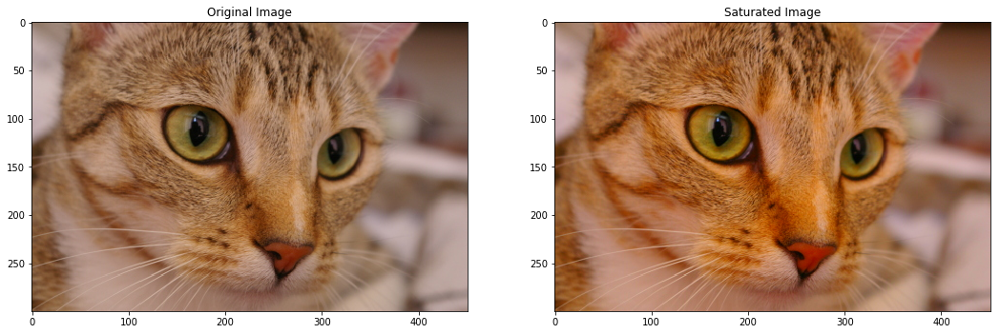

In [6]:
# Test Saturation

configs = [('Saturation', {'value': 1.5})]

pipeline = ImageDegradationPipeline(configs)

cat_blurred = pipeline(cat_tensor)

cat_blurred_numpy = tensor2numpy(cat_blurred)

plt.figure(figsize=(18, 18))

plt.subplot(121)
plt.imshow(cat)
plt.title('Original Image')

plt.subplot(122)
plt.imshow(cat_blurred_numpy)
plt.title('Saturated Image')


plt.show()

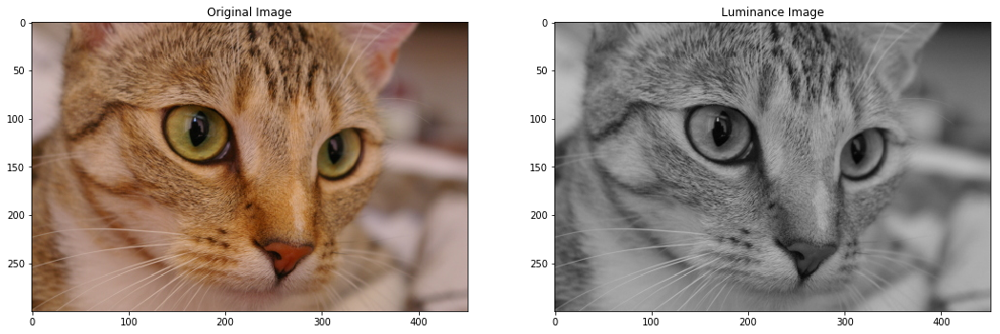

In [7]:
# Test RGB2YUV
from data_generation.constants import RGB2YUV

configs = [('ColorSpaceConversionMatrix', {'matrix': RGB2YUV})]

pipeline = ImageDegradationPipeline(configs)

cat_blurred = pipeline(cat_tensor)

cat_blurred_numpy = tensor2numpy(cat_blurred[:, 0:1, ...].expand(-1, 3, -1,-1))
# cat_blurred_numpy = tensor2numpy(0.5*(cat_blurred[:, 2:3, ...].expand(-1, 3, -1,-1)+1))

plt.figure(figsize=(18, 18))

plt.subplot(121)
plt.imshow(cat)
plt.title('Original Image')

plt.subplot(122)
plt.imshow(cat_blurred_numpy)
plt.title('Luminance Image')


plt.show()

In [8]:
torch.min(cat_blurred[:, 1:2, ...])

tensor(-0.3631)

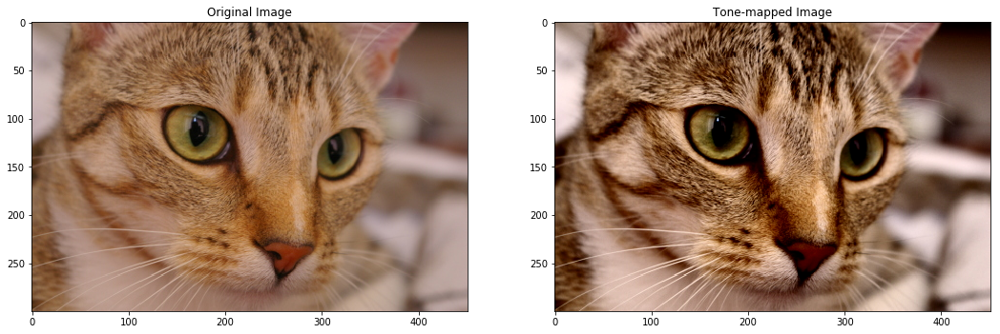

In [9]:
# Test ToneCurve.

configs = [('ToneCurve', {"amount": 1.0}),
          ]

pipeline = ImageDegradationPipeline(configs)

cat_blurred = pipeline(cat_tensor)

cat_blurred_numpy = tensor2numpy(cat_blurred)

plt.figure(figsize=(18, 18))

plt.subplot(121)
plt.imshow(cat)
plt.title('Original Image')

plt.subplot(122)
plt.imshow(cat_blurred_numpy)
plt.title('Tone-mapped Image')


plt.show()

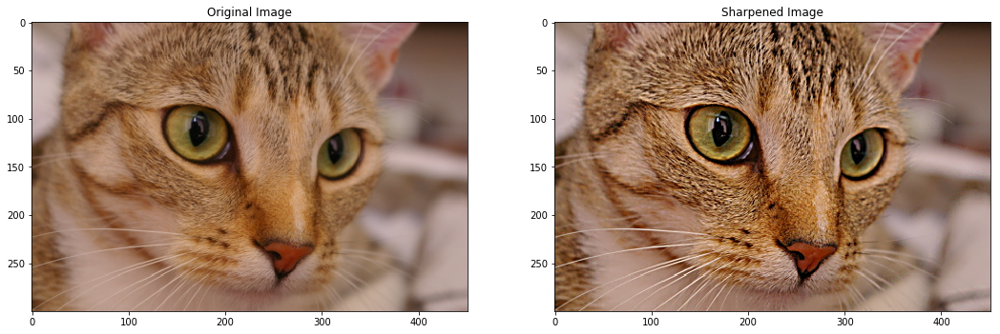

In [10]:
# Test Unsharp Mask.

configs = [('Unsharpen', {"amount": 1.5, "radius": 4, "threshold": 3.0}),
          ]

pipeline = ImageDegradationPipeline(configs)

cat_blurred = pipeline(cat_tensor)

cat_blurred_numpy = tensor2numpy(cat_blurred)

plt.figure(figsize=(18, 18))

plt.subplot(121)
plt.imshow(cat)
plt.title('Original Image')

plt.subplot(122)
plt.imshow(cat_blurred_numpy)
plt.title('Sharpened Image')


plt.show()

Using AHD Non-differentiable


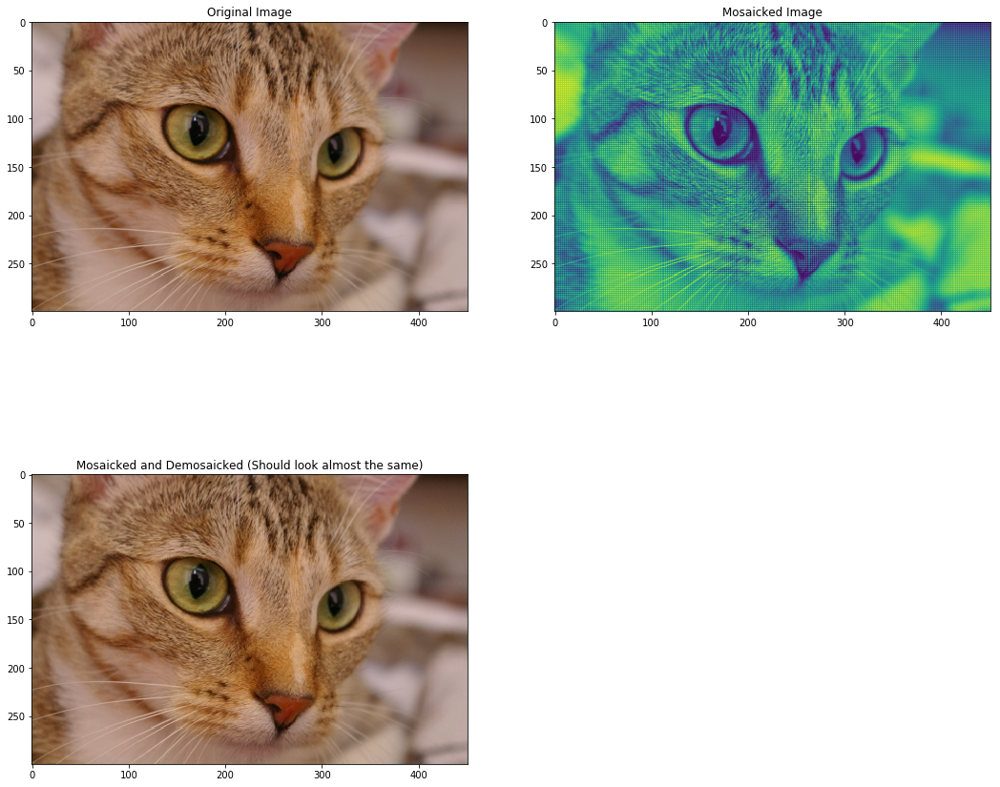

In [11]:
# Test Demosaicking

configs = [('BayerMosaicking',{})]

pipeline = ImageDegradationPipeline(configs)

cat_gamma = pipeline(cat_tensor)
cat_gamma = tensor2numpy(cat_gamma)


plt.figure(figsize=(18, 16))
plt.subplot(221)
plt.imshow(cat)
plt.title('Original Image')

plt.subplot(222)
plt.imshow(cat_gamma)
plt.title('Mosaicked Image')

# Do compression and undo it

configs = [('BayerMosaicking',{}), ('AHDDemosaickingNonDifferentiable',{})]

pipeline = ImageDegradationPipeline(configs)

cat_gamma = pipeline(cat_tensor)
cat_gamma = tensor2numpy(cat_gamma)

plt.subplot(223)
plt.imshow(cat_gamma)
plt.title('Mosaicked and Demosaicked (Should look almost the same)')

plt.show()

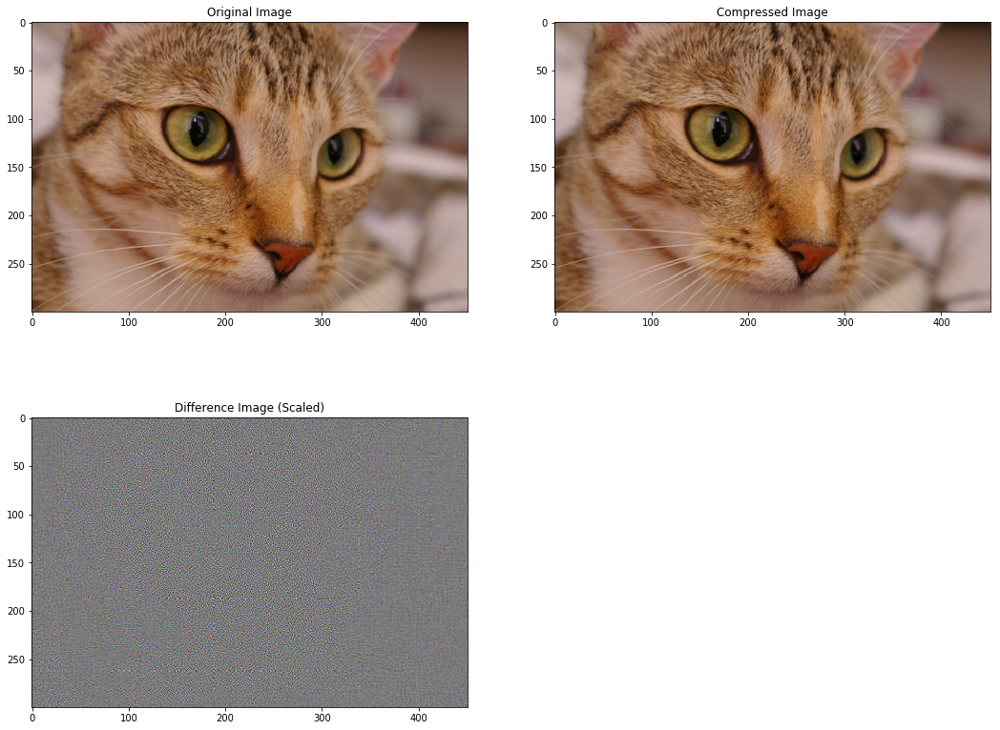

In [12]:
# Test JPEG Compression

configs = [('JPEGCompression', {"quality": 10}),
           ('PixelClip', {})
          ]

pipeline = ImageDegradationPipeline(configs)

cat_blurred = pipeline(cat_tensor)

cat_blurred_numpy = tensor2numpy(cat_blurred)

cat_diff = (cat_blurred_numpy.astype('float') - cat.astype('float')) 
cat_diff = cat_diff / (np.amax(np.abs(cat_diff)) + 0.00001)
cat_diff = (cat_diff + 1) * 127.5
cat_diff = np.clip(cat_diff, 0, 255)
cat_diff = cat_diff.astype('uint8')

plt.figure(figsize=(18, 14))

plt.subplot(221)
plt.imshow(cat)
plt.title('Original Image')

plt.subplot(222)
plt.imshow(cat_blurred_numpy)
plt.title('Compressed Image')

plt.subplot(223)
plt.imshow(cat_diff)
plt.title('Difference Image (Scaled)')

plt.show()

Image Size should match
(300, 451, 3)
(300, 451, 3)


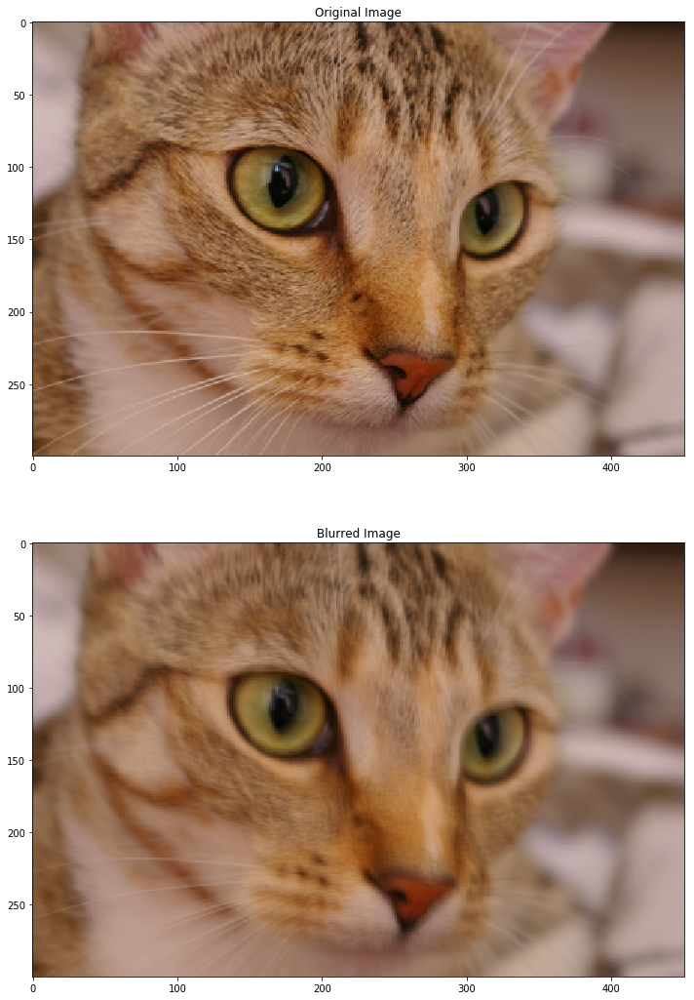

In [13]:
# Test Motion Blur

configs = [('MotionBlur', {'amt': [3, 2, 5], 'direction': [0, 45, 90]})]

pipeline = ImageDegradationPipeline(configs)

cat_blurred = pipeline(cat_tensor)

cat_blurred_numpy = tensor2numpy(cat_blurred)

print("Image Size should match")
print(cat.shape)
print(cat_blurred_numpy.shape)

plt.figure(figsize=(18, 18))

plt.subplot(211)
plt.imshow(cat)
plt.title('Original Image')

plt.subplot(212)
plt.imshow(cat_blurred_numpy)
plt.title('Blurred Image')

plt.show()


Image Size should match
(300, 451, 3)
(300, 451, 3)


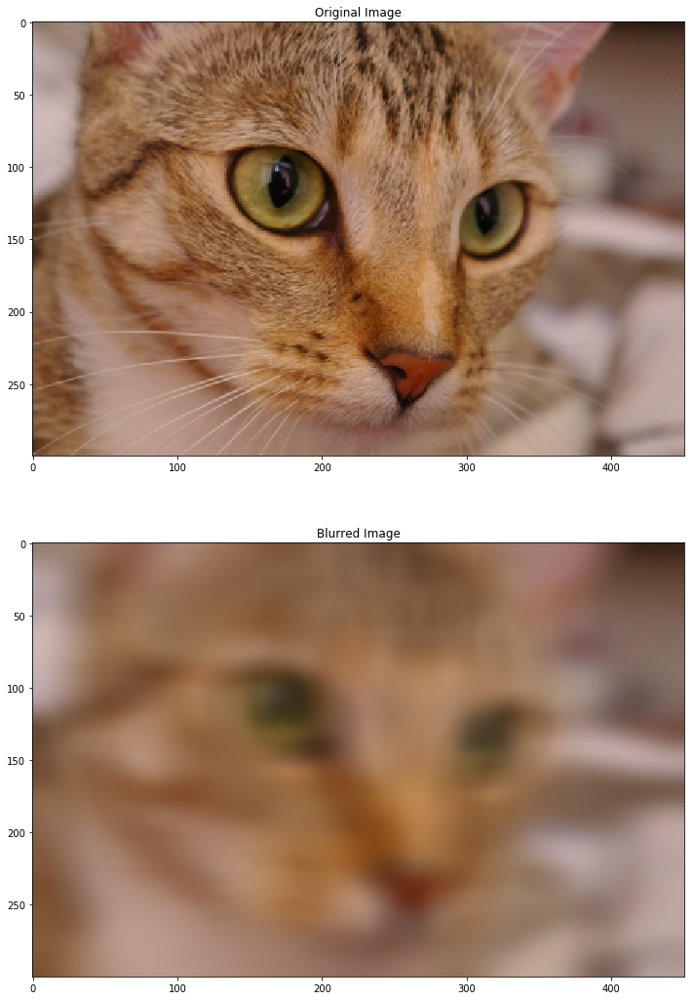

In [14]:
# Test Gaussian Blur
configs = [('GaussianBlur', {'sigma_x': 20.0, 'sigma_y': 10.0})]

pipeline = ImageDegradationPipeline(configs)

cat_blurred = pipeline(cat_tensor)

cat_blurred_numpy = tensor2numpy(cat_blurred)

print("Image Size should match")
print(cat.shape)
print(cat_blurred_numpy.shape)

plt.figure(figsize=(18, 18))

plt.subplot(211)
plt.imshow(cat)
plt.title('Original Image')

plt.subplot(212)
plt.imshow(cat_blurred_numpy)
plt.title('Blurred Image')

plt.show()


In [15]:
# Test Bilinear Upsampling

configs = [('PytorchResizing', {'resizing_factor': 2.0, 'mode':'bilinear'})]

sample_image = torch.FloatTensor([[1, 0, 0, 1],
                                  [2, 3, 3, 2],
                                  [2, 3, 3, 2],
                                  [1, 0, 0, 1]
                      ]).unsqueeze(0).unsqueeze(0)

pipeline = ImageDegradationPipeline(configs)

sample_image_resized = pipeline(sample_image)

print(sample_image_resized)


tensor([[[[1.0000, 0.7500, 0.2500, 0.0000, 0.0000, 0.2500, 0.7500, 1.0000],
          [1.2500, 1.1250, 0.8750, 0.7500, 0.7500, 0.8750, 1.1250, 1.2500],
          [1.7500, 1.8750, 2.1250, 2.2500, 2.2500, 2.1250, 1.8750, 1.7500],
          [2.0000, 2.2500, 2.7500, 3.0000, 3.0000, 2.7500, 2.2500, 2.0000],
          [2.0000, 2.2500, 2.7500, 3.0000, 3.0000, 2.7500, 2.2500, 2.0000],
          [1.7500, 1.8750, 2.1250, 2.2500, 2.2500, 2.1250, 1.8750, 1.7500],
          [1.2500, 1.1250, 0.8750, 0.7500, 0.7500, 0.8750, 1.1250, 1.2500],
          [1.0000, 0.7500, 0.2500, 0.0000, 0.0000, 0.2500, 0.7500, 1.0000]]]])


/media/hdd5tb/tiam/bin/.virtualenvs/camsim/local/lib/python3.6/site-packages/torch/nn/functional.py:1961: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode))


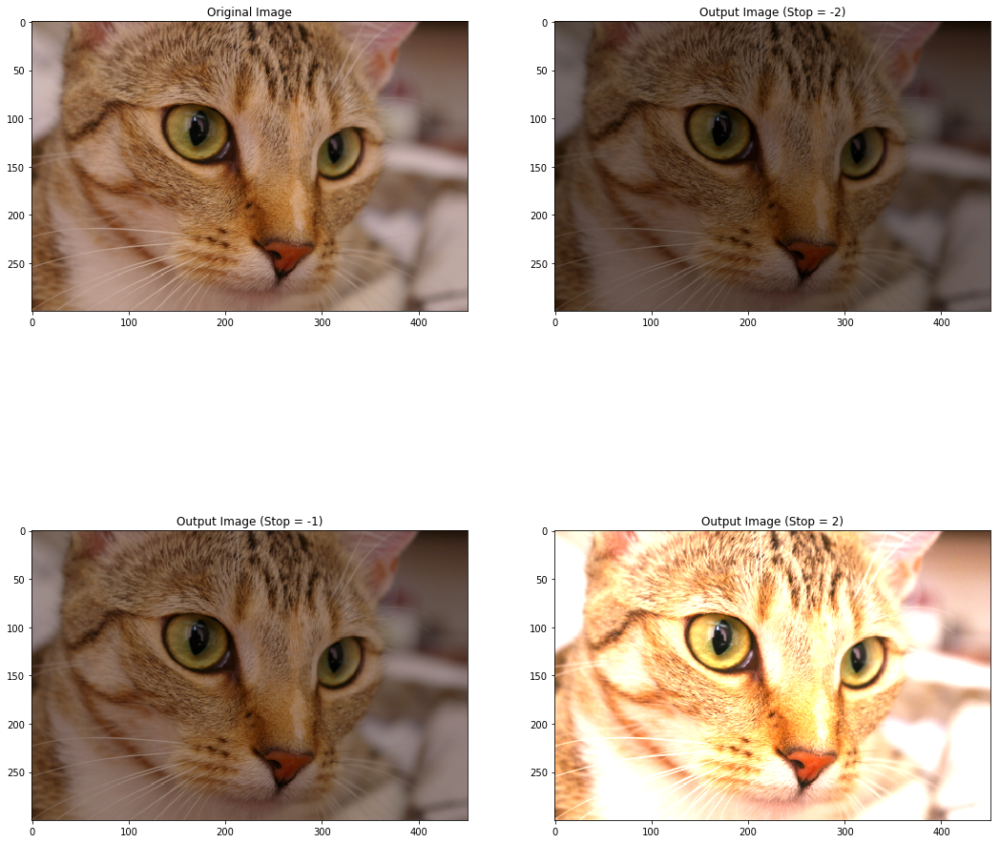

In [16]:
# Test Exposure Adjustment

nstops = [-2, -1, 2]

configs = [('UndosRGBGamma', {}),
           ('ExposureAdjustment', {'nstops': FloatTensor(nstops)}),
           ('sRGBGamma', {})
          ]

pipeline = ImageDegradationPipeline(configs)

cat_adjusted = pipeline(cat_tensor)
# Run again on GPU
pipeline = pipeline.cuda()
cat_adjusted = pipeline(cat_tensor.cuda()).cpu()


plt.figure(figsize=(18, 18))
plt.subplot(221)
plt.imshow(cat)
plt.title('Original Image')

for i, t in enumerate(nstops):
    cat_adjusted_numpy = tensor2numpy(cat_adjusted, i)
    plt.subplot(222 + i)
    plt.imshow(cat_adjusted_numpy)
    plt.title('Output Image (Stop = {})'.format(t))
plt.show()

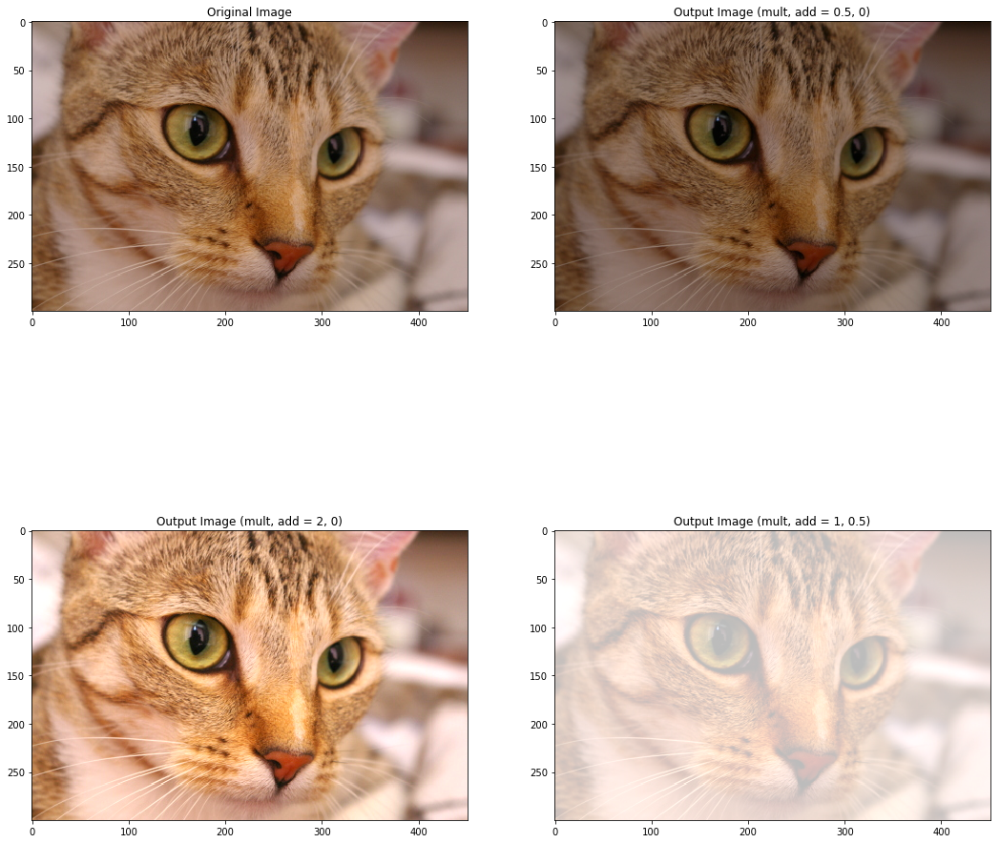

In [17]:
# Test Affine Exposure Adjustment

mult = [0.5, 2, 1]
add = [0, 0, 0.5]

configs = [('UndosRGBGamma', {}),
           ('AffineExposure', {'mult': FloatTensor(mult),
                               'add': FloatTensor(add)}),
           ('sRGBGamma', {})
          ]

pipeline = ImageDegradationPipeline(configs)

cat_adjusted = pipeline(cat_tensor)
# Run again on GPU
pipeline = pipeline.cuda()
cat_adjusted = pipeline(cat_tensor.cuda()).cpu()


plt.figure(figsize=(18, 18))
plt.subplot(221)
plt.imshow(cat)
plt.title('Original Image')

for i, t in enumerate(nstops):
    cat_adjusted_numpy = tensor2numpy(cat_adjusted, i)
    plt.subplot(222 + i)
    plt.imshow(cat_adjusted_numpy)
    plt.title('Output Image (mult, add = {}, {})'.format(mult[i], add[i]))
plt.show()

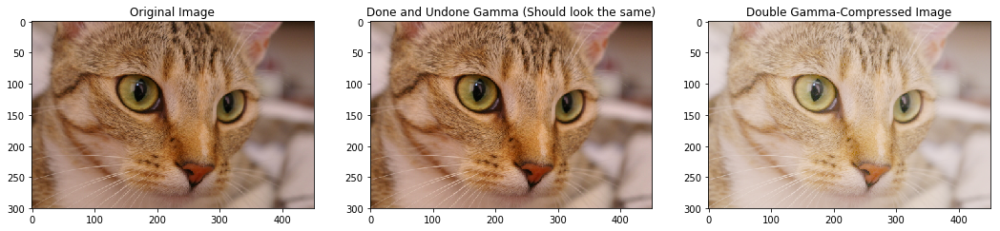

In [18]:
# Test sRGB Gamma

configs = [('sRGBGamma',{})]

pipeline = ImageDegradationPipeline(configs)

cat_gamma = pipeline(cat_tensor)
cat_gamma = tensor2numpy(cat_gamma)


plt.figure(figsize=(18, 16))
plt.subplot(131)
plt.imshow(cat)
plt.title('Original Image')

plt.subplot(133)
plt.imshow(cat_gamma)
plt.title('Double Gamma-Compressed Image')

# Do compression and undo it

configs = [('sRGBGamma',{}), ('UndosRGBGamma',{})]

pipeline = ImageDegradationPipeline(configs)

cat_gamma = pipeline(cat_tensor)
# Run again on GPU
pipeline = pipeline.cuda()
cat_gamma = pipeline(cat_tensor.cuda()).cpu()
cat_gamma = tensor2numpy(cat_gamma)

plt.subplot(132)
plt.imshow(cat_gamma)
plt.title('Done and Undone Gamma (Should look the same)')

plt.show()

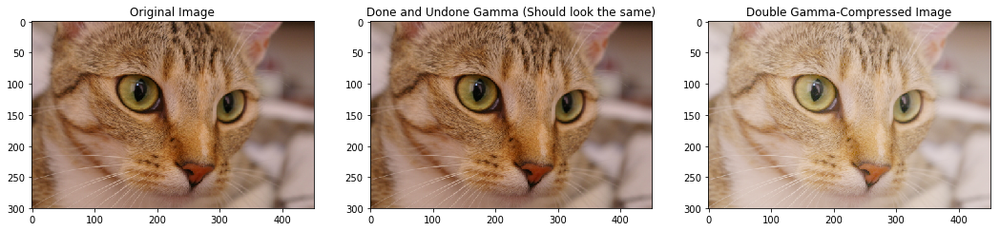

In [19]:
# Test power Gamma

configs = [('GammaCompression', {'gamma': 0.5})]

pipeline = ImageDegradationPipeline(configs)

cat_gamma = pipeline(cat_tensor)
cat_gamma = tensor2numpy(cat_gamma)


plt.figure(figsize=(18, 16))
plt.subplot(131)
plt.imshow(cat)
plt.title('Original Image')

plt.subplot(133)
plt.imshow(cat_gamma)
plt.title('Double Gamma-Compressed Image')

# Do compression and undo it

configs = [('GammaCompression', {'gamma': 0.5}),
           ('UndoGammaCompression', {'gamma': 0.5})]

pipeline = ImageDegradationPipeline(configs)

cat_gamma = pipeline(cat_tensor)
# Run again on GPU
pipeline = pipeline.cuda()
cat_gamma = pipeline(cat_tensor.cuda()).cpu()
cat_gamma = tensor2numpy(cat_gamma)

plt.subplot(132)
plt.imshow(cat_gamma)
plt.title('Done and Undone Gamma (Should look the same)')

plt.show()

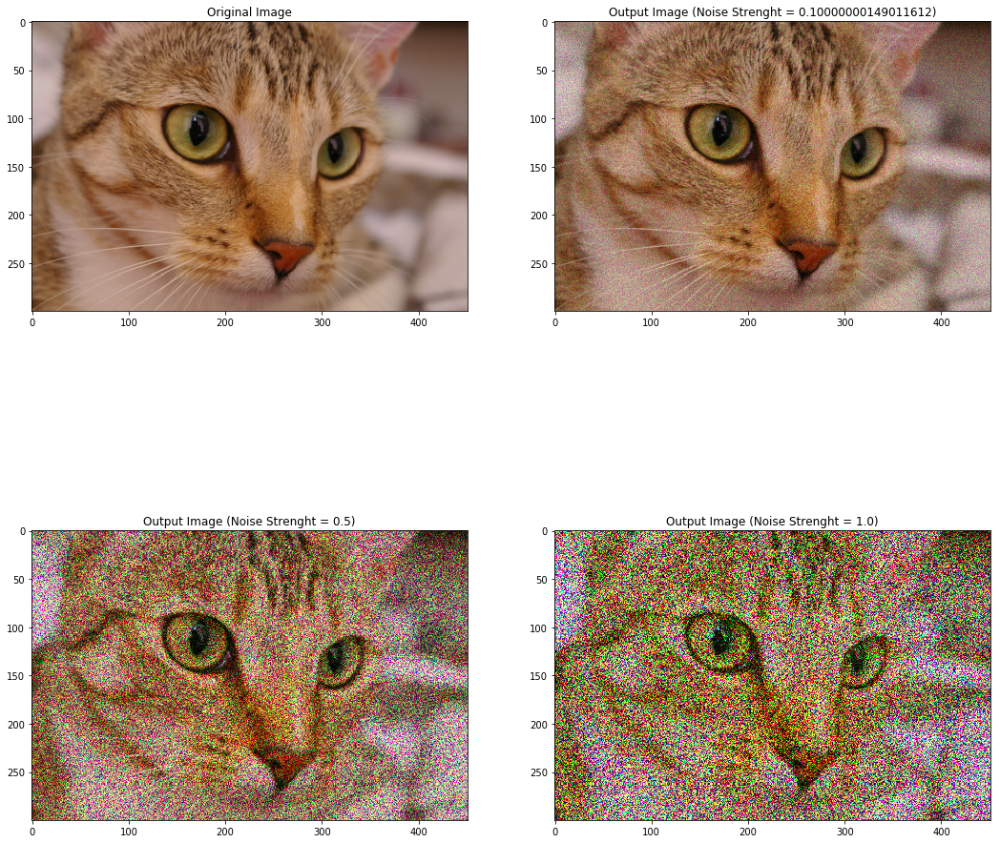

In [20]:
# Test poisson noise

noise_mult = FloatTensor([0.1, 0.5, 1.0])
sigmas = FloatTensor([0.6, 1.0, 0.3]).unsqueeze(0) * noise_mult.unsqueeze(-1)
configs = [('PoissonNoise',{'sigma': sigmas, 'mosaick_pattern': None})]

pipeline = ImageDegradationPipeline(configs)

cat_noise = pipeline(cat_tensor)
# Run again on GPU
pipeline = pipeline.cuda()
cat_noise = pipeline(cat_tensor.cuda()).cpu()

plt.figure(figsize=(18, 18))
plt.subplot(221)
plt.imshow(cat)
plt.title('Original Image')

for i, t in enumerate(noise_mult):
    cat_noise_numpy = tensor2numpy(cat_noise, i)
    plt.subplot(222 + i)
    plt.imshow(cat_noise_numpy)
    plt.title('Output Image (Noise Strenght = {})'.format(t))
plt.show()

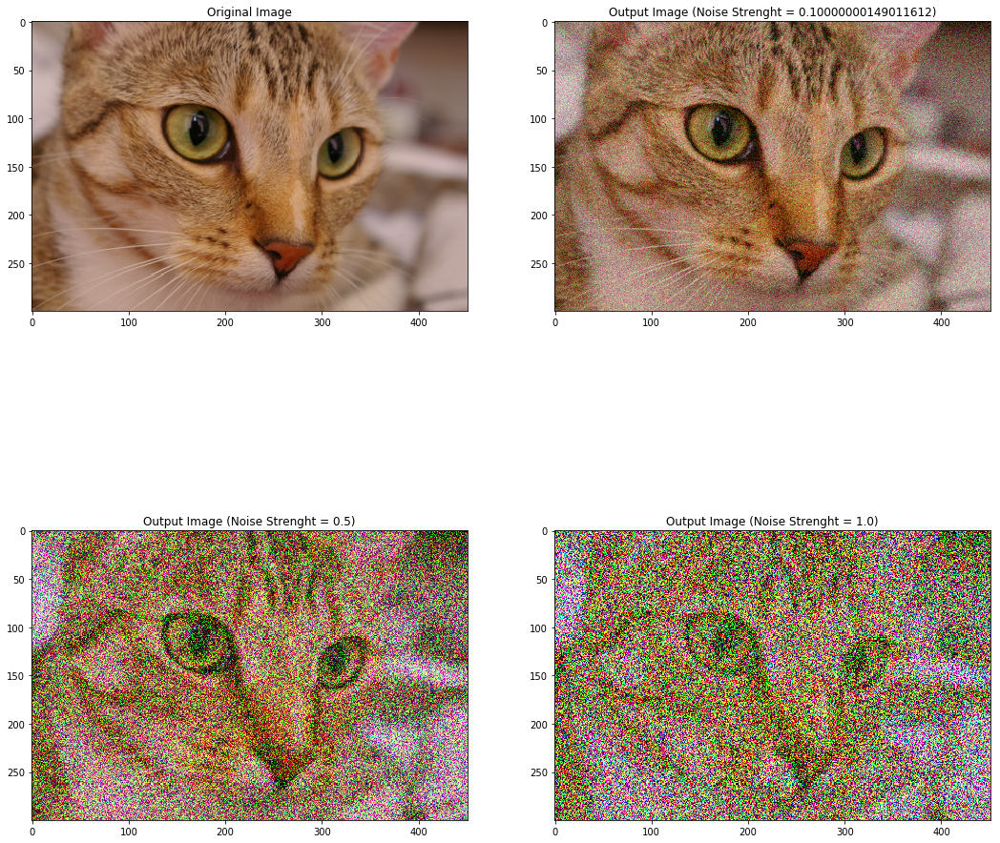

In [21]:
# Test Gaussian noise
noise_mult = FloatTensor([0.1, 0.5, 1.0])
sigmas = FloatTensor([0.6, 1.0, 0.3]).unsqueeze(0) * noise_mult.unsqueeze(-1)
configs = [('GaussianNoise',{'sigma': sigmas, 'mosaick_pattern': None})]

pipeline = ImageDegradationPipeline(configs)

cat_noise = pipeline(cat_tensor)
# Run again on GPU
pipeline = pipeline.cuda()
cat_noise = pipeline(cat_tensor.cuda()).cpu()

plt.figure(figsize=(18, 18))
plt.subplot(221)
plt.imshow(cat)
plt.title('Original Image')

for i, t in enumerate(noise_mult):
    cat_noise_numpy = tensor2numpy(cat_noise, i)
    plt.subplot(222 + i)
    plt.imshow(cat_noise_numpy)
    plt.title('Output Image (Noise Strenght = {})'.format(t))
plt.show()

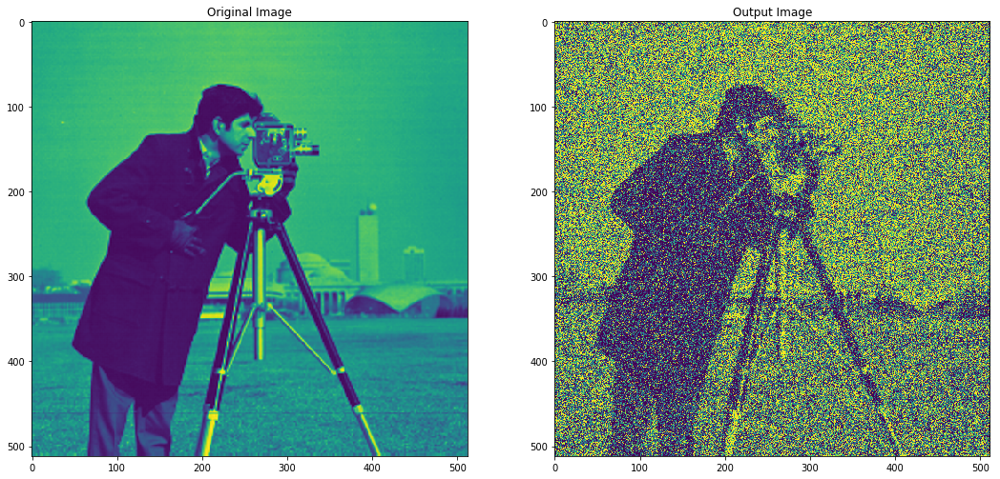

In [22]:
# test 1D image

configs = [('GaussianNoise',{'sigma': FloatTensor([1.0])*0.5, 'mosaick_pattern': None})]

pipeline = ImageDegradationPipeline(configs)

camera_noise = pipeline(camera_tensor)
camera_noise = tensor2numpy(camera_noise)


plt.figure(figsize=(18, 16))
plt.subplot(121)
plt.imshow(camera)
plt.title('Original Image')

plt.subplot(122)
plt.imshow(camera_noise)
plt.title('Output Image')
plt.show()

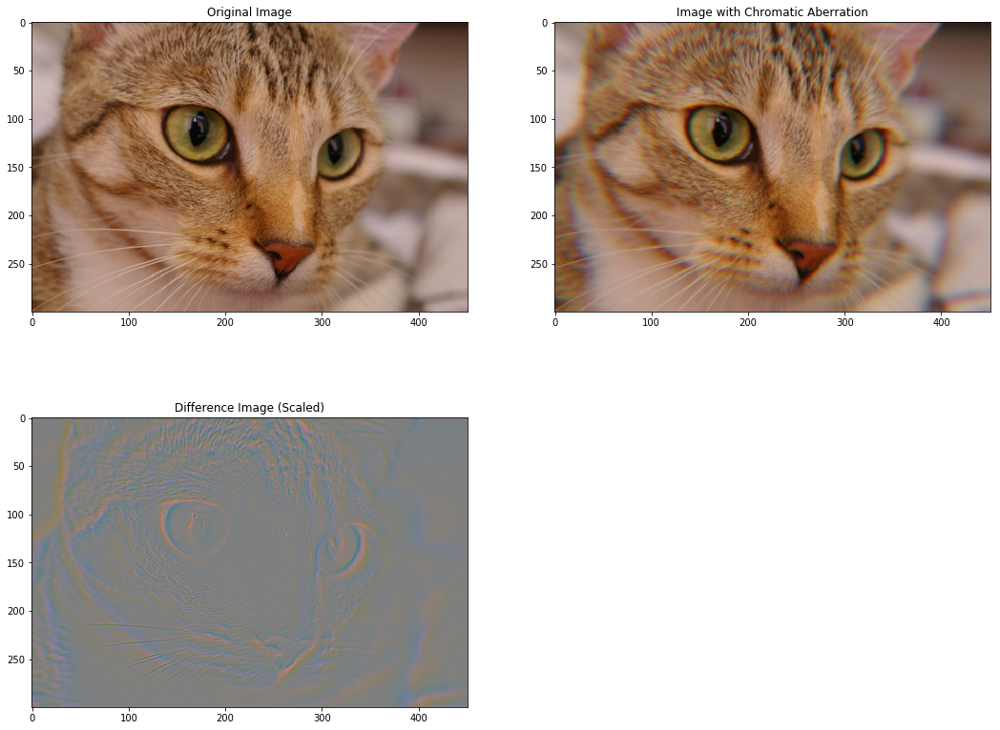

In [23]:
# Test Chromatic Aberration.

configs = [('ChromaticAberration', {"scaling": 1.02}),
          ]

pipeline = ImageDegradationPipeline(configs)

cat_blurred = pipeline(cat_tensor)

cat_blurred_numpy = tensor2numpy(cat_blurred)

cat_diff = (cat_blurred_numpy.astype('float') - cat.astype('float')) 
cat_diff = cat_diff / (np.amax(np.abs(cat_diff)) + 0.00001)
cat_diff = (cat_diff + 1) * 127.5
cat_diff = np.clip(cat_diff, 0, 255)
cat_diff = cat_diff.astype('uint8')

plt.figure(figsize=(18, 14))

plt.subplot(221)
plt.imshow(cat)
plt.title('Original Image')

plt.subplot(222)
plt.imshow(cat_blurred_numpy)
plt.title('Image with Chromatic Aberration')

plt.subplot(223)
plt.imshow(cat_diff)
plt.title('Difference Image (Scaled)')

plt.show()

In [24]:
# Test Denoising

noise_mult = FloatTensor([0.1, 0.5, 1.0])
sigmas = FloatTensor([0.6, 1.0, 0.3]).unsqueeze(0) * noise_mult.unsqueeze(-1)
configs = [('PoissonNoise',{'sigma': sigmas, 'mosaick_pattern': None})]

pipeline = ImageDegradationPipeline(configs)

cat_noise = pipeline(cat_tensor)

print(torch.max(cat_tensor))
print(torch.min(cat_tensor))
print(torch.mean(cat_tensor))

# First Add Noise

configs = [('DenoisingBilateral',{'sigma_s': 5.0,
                                  'sigma_r': 0.1})]

pipeline = ImageDegradationPipeline(configs)

cat_denoised = pipeline(cat_noise)

cat_noise = tensor2numpy(cat_noise)
cat_denoised = tensor2numpy(cat_denoised)


plt.figure(figsize=(18, 14))
plt.subplot(221)
plt.imshow(cat)
plt.title('Original Image')

plt.subplot(222)
plt.imshow(cat_noise)
plt.title('Noise Image')


plt.subplot(223)
plt.imshow(cat_denoised)
plt.title('Denoised Image')

plt.show()

tensor(0.9059)
tensor(0.)
tensor(0.4522)


RuntimeError: Need halide in order to run this

In [ ]:
# Test Demosaicking

configs = [('BayerMosaicking',{})]

pipeline = ImageDegradationPipeline(configs)

cat_gamma = pipeline(cat_tensor)
cat_gamma = tensor2numpy(cat_gamma)


plt.figure(figsize=(18, 16))
plt.subplot(221)
plt.imshow(cat)
plt.title('Original Image')

plt.subplot(222)
plt.imshow(cat_gamma)
plt.title('Mosaicked Image')

# Do compression and undo it

configs = [('BayerMosaicking',{}), ('NaiveDemosaicking',{})]

pipeline = ImageDegradationPipeline(configs)

cat_gamma = pipeline(cat_tensor)
cat_gamma = tensor2numpy(cat_gamma)

plt.subplot(223)
plt.imshow(cat_gamma)
plt.title('Mosaicked and Demosaicked (Should look almost the same)')


# Test Demosaicking on GPU
# This doesn't work yet...

# configs = [('BayerMosaicking',{}), ('NaiveDemosaicking',{})]

# pipeline = ImageDegradationPipeline(configs)
# pipeline = pipeline.cuda()
# cat_tensor_gpu = cat_tensor.cuda()

# cat_gamma = pipeline(cat_tensor_gpu)
# cat_gamma = tensor2numpy(cat_gamma)

# plt.subplot(224)
# plt.imshow(cat_gamma)
# plt.title('Mosaicked and Demosaicked (on GPU)')
plt.show()

In [ ]:
# Test Upsampling

configs = [('BicubicResizing', {'resizing_factor': 2.0})]

pipeline = ImageDegradationPipeline(configs)

cat_resized = pipeline(cat_tensor)

cat_resized_numpy = tensor2numpy(cat_resized)

plt.figure(figsize=(18, 18))

plt.subplot(211)
plt.imshow(cat)
plt.title('Original Image')

plt.subplot(212)
plt.imshow(cat_resized_numpy)
plt.title('2x Resized Image')

plt.show()
